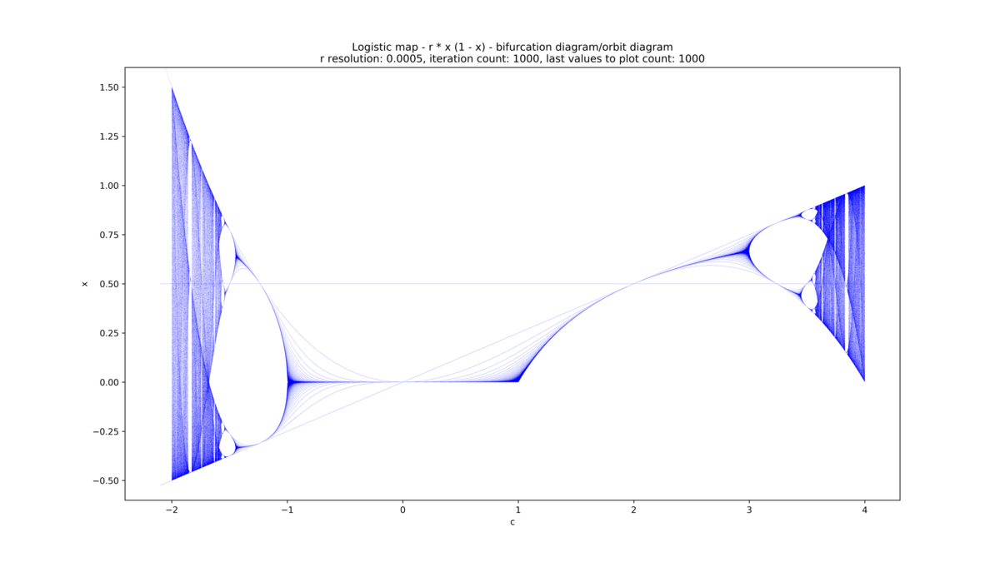

# Logistic Map


The logistic map is a discrete dynamical system defined by the quadratic difference equation:

$$
x_{n+1} = r x_n (1 - x_n)
$$

Equivalently, it is a recurrence relation and a polynomial mapping of degree 2.  
It is often referred to as an **archetypal example** of how complex, chaotic behaviour can arise from very simple nonlinear dynamical equations.


<div style="font-size:20px; font-family:Georgia">

The map was initially utilized by Edward Lorenz in the 1960s to showcase properties of irregular solutions in climate systems.  


</div>


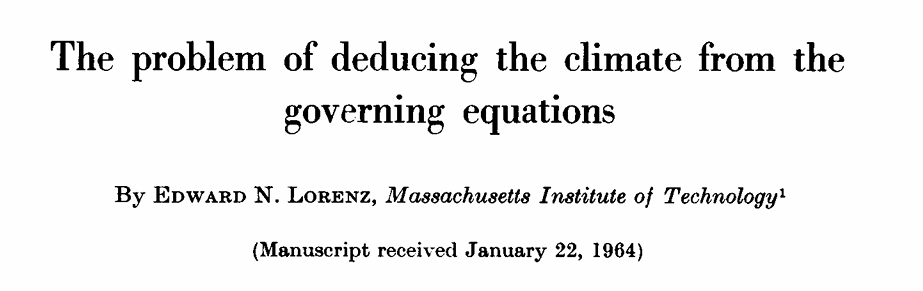

It was popularized in a 1976 paper by the biologist Robert May, in part as a discrete-time demographic model analogous to the logistic equation written down by Pierre François Verhulst.

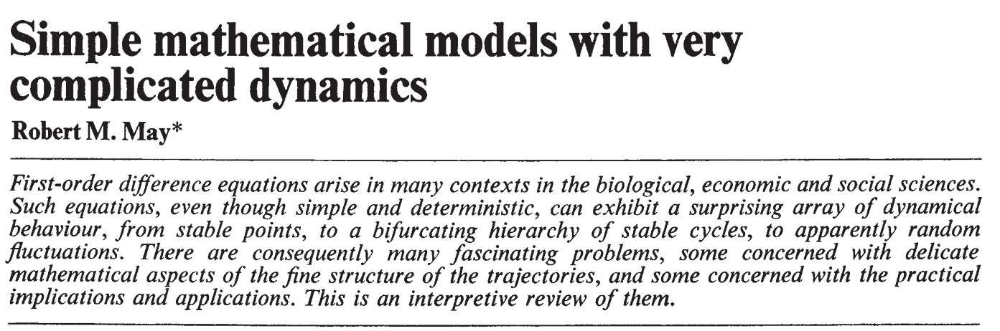

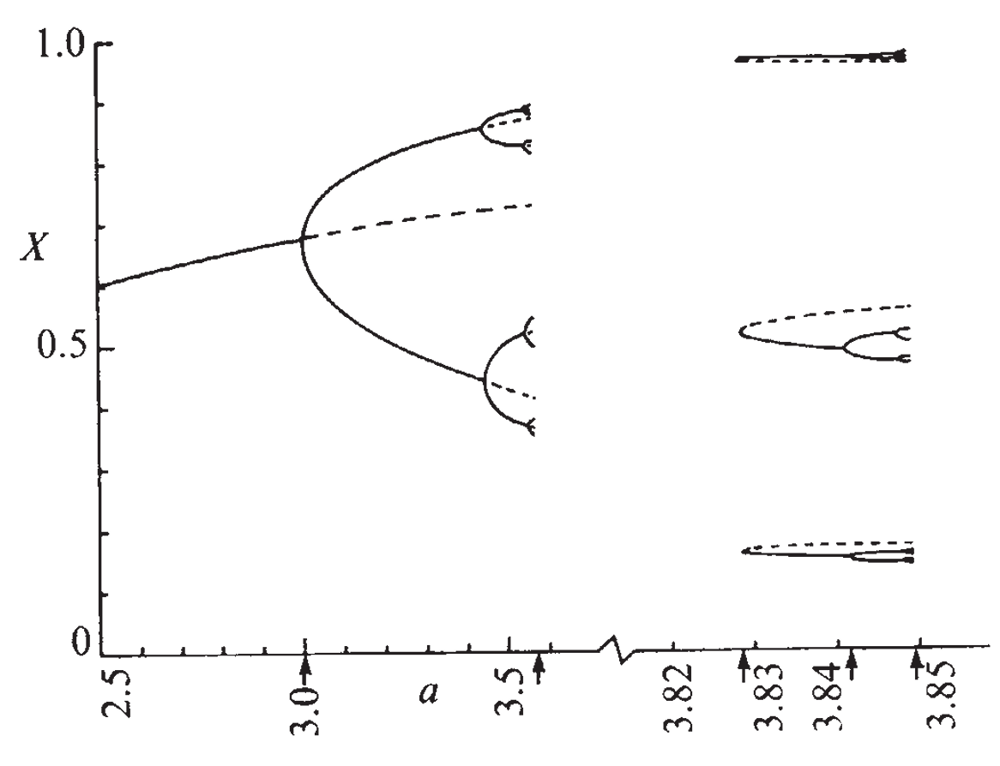

# Example



In the logistic map, $x$ is a variable, and $r$ is a parameter. It is a map in the sense that it maps a configuration or phase space to itself (in this simple case the space is one-dimensional in the variable $x$).

The map is given by:

$$
f(x) = r x (1 - x)
$$

It can be interpreted as a tool to get the next position in the configuration space after one time step. The difference equation is a discrete version of the logistic differential equation, which can be compared to a time evolution equation of the system.

Given an appropriate value for the parameter $r$ and performing calculations starting from an initial condition $x_0$, we obtain the sequence:

$$
x_0, x_1, x_2, \dots
$$

which can be interpreted as a sequence of time steps in the evolution of the system.

In the field of dynamical systems, this sequence is called an orbit, and the orbit changes depending on the value given to the parameter. When the parameter is changed, the orbit of the logistic map can change in various ways, such as:





This was the initial approach of Henri Poincaré to study dynamical systems and ultimately chaos starting from the study of fixed points or in other words states that do not change over time

## Demographic model example


This nonlinear difference equation is intended to capture two effects:

- **Reproduction**: where the population will increase at a rate proportional to the current population when the population size is small,

- **Starvation (density-dependent mortality)**: where the growth rate will decrease at a rate proportional to the value obtained by taking the theoretical "carrying capacity" of the environment less the current population.


# Characterization of the logistic map

 Single Plot

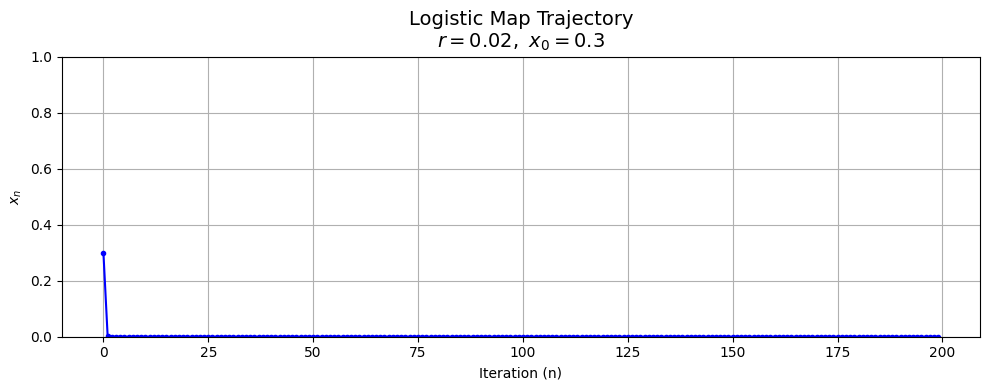

In [8]:
import numpy as np
import matplotlib.pyplot as plt


def logistic_map(r, x):
    return r * x * (1 - x)


def plot_logistic_trajectory(r, x0=0.3, steps=200):
    x = np.zeros(steps)
    x[0] = x0
    for i in range(1, steps):
        x[i] = logistic_map(r, x[i-1])


    plt.figure(figsize=(10, 4))
    plt.plot(range(steps), x, '-o', markersize=3, color='blue')
    plt.title(f"Logistic Map Trajectory\n$r = {r},\ x_0 = {x0}$", fontsize=14)
    plt.xlabel("Iteration (n)")
    plt.ylabel("$x_n$")
    plt.ylim(0, 1)
    plt.grid(True)
    plt.tight_layout()
    plt.show()


plot_logistic_trajectory(r=0.02, x0=0.3, steps=200)


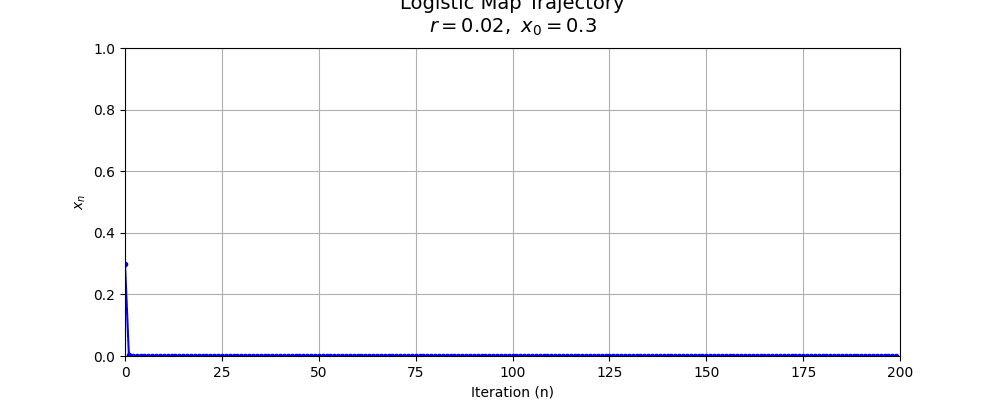

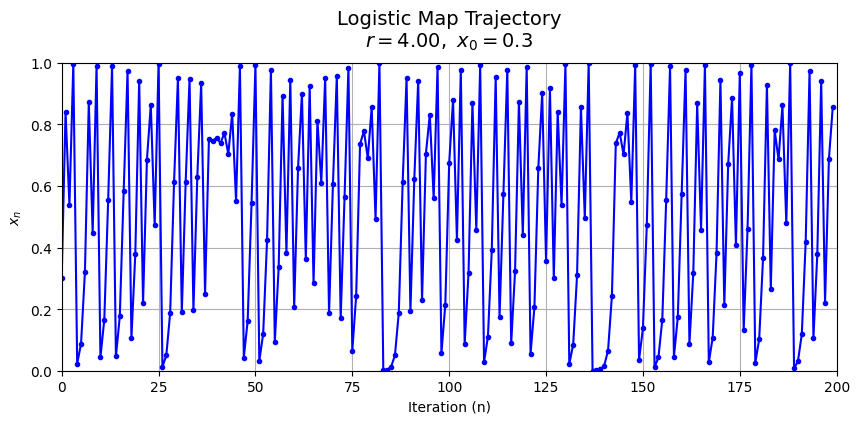

In [11]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import Image


def logistic_map(r, x):
    return r * x * (1 - x)


x0 = 0.3
steps = 200
r_values = np.arange(0.02, 4.02, 0.02)

fig, ax = plt.subplots(figsize=(10, 4))
line, = ax.plot([], [], '-o', markersize=3, color='blue')
title = ax.text(0.5, 1.05, "", transform=ax.transAxes, ha="center", fontsize=14)

ax.set_xlim(0, steps)
ax.set_ylim(0, 1)
ax.set_xlabel("Iteration (n)")
ax.set_ylabel("$x_n$")
ax.grid(True)


def init():
    line.set_data([], [])
    title.set_text("")
    return line, title


def update(frame):
    r = r_values[frame]
    x = np.zeros(steps)
    x[0] = x0
    for i in range(1, steps):
        x[i] = logistic_map(r, x[i - 1])
    line.set_data(range(steps), x)
    title.set_text(f"Logistic Map Trajectory\n$r = {r:.2f},\ x_0 = {x0}$")
    return line, title

ani = animation.FuncAnimation(
    fig, update, frames=len(r_values), init_func=init,
    interval=100, blit=True, repeat=False
)


ani.save('logistic_map_animation.gif', writer='pillow', fps=10)


from IPython.display import Image
Image(filename="logistic_map_animation.gif")



A first observation is that the sequence does not diverge and remains finite for $r$ between 0 and 4.

It is possible to observe the following qualitative phenomena in order of time:

- **Exponential convergence to zero**
- **Convergence to a non-zero fixed value**
- **Initial oscillation and then convergence**
- **Stable oscillations between two values**
- **Growing oscillations between a set of values which are multiples of two**
- **Intermittency** (i.e., bursts of oscillations at the onset of chaos)
- **Fully developed chaotic oscillations**
- **Topological mixing** (i.e., the tendency of oscillations to cover the full available space)



The first four are also available in standard linear systems, oscillations between two values are available too under resonance, chaotic systems though have typically a large range of resonance conditions. The other phenomena are peculiar to chaos.This progression of stages is strikingly similar to the onset of turbulence.

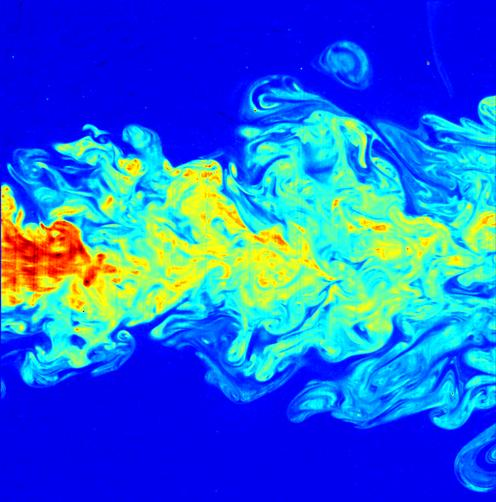

# Domain, graphs and fixed points

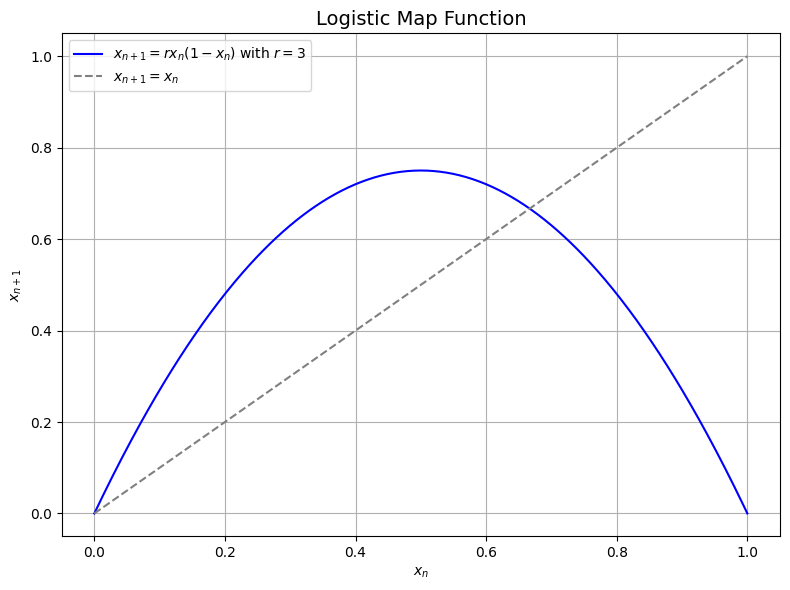

In [14]:
import numpy as np
import matplotlib.pyplot as plt


def logistic_function(x, r):
    return r * x * (1 - x)

# smaller than 4
r = 3
x = np.linspace(0, 1, 500)
y = logistic_function(x, r)


plt.figure(figsize=(8, 6))
plt.plot(x, y, label=fr"$x_{{n+1}} = r x_n (1 - x_n)$ with $r={r}$", color='blue')
plt.plot(x, x, linestyle='--', color='gray', label="$x_{n+1} = x_n$")
plt.title("Logistic Map Function", fontsize=14)
plt.xlabel("$x_n$")
plt.ylabel("$x_{n+1}$")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()



One of the uses of graphs is to illustrate **fixed points**, also called **invariant points**.

Draw a line $y = x$ (a 45° line) on the graph of the map.  
If there is a point where this 45° line intersects with the graph, that point is a fixed point.

In mathematical terms, a fixed point is defined by:

$$
f(x) = x
$$

It means a point that does not change when the map is applied.  
We will denote the fixed point as $x^*$. In the case of the logistic map, the fixed point that satisfies equation (2-2) is obtained by solving:

$$
rx(1 - x) = x
$$

Rewriting and solving:

$$
rx - rx^2 = x \\
rx - rx^2 - x = 0 \\
x(r - 1 - rx) = 0
$$

which gives the solutions:

$$
x^* = 0 \quad \text{or} \quad x^* = \frac{r - 1}{r}
$$


Another graphical technique that can be used for one-variable mappings is the **spider web projection**.

After determining an initial value $x_0$ on the horizontal axis, follow these steps:

1. Draw a **vertical line** from the initial value $x_0$ to the curve of $f(x)$.
2. From the intersection point on $f(x)$, draw a **horizontal line** to the 45° line $y = x$.
3. From the intersection with the 45° line, draw another **vertical line** down (or up) to the curve of $f(x)$.
4. Repeat this process iteratively.

By continuing this sequence, a **spider web** or **staircase-like diagram** is created on the plane.

This construction is equivalent to **graphically calculating the trajectory**, and the spider web diagram represents the trajectory starting from $x_0$.  
This projection allows the overall behavior of the trajectory to be seen at a glance.


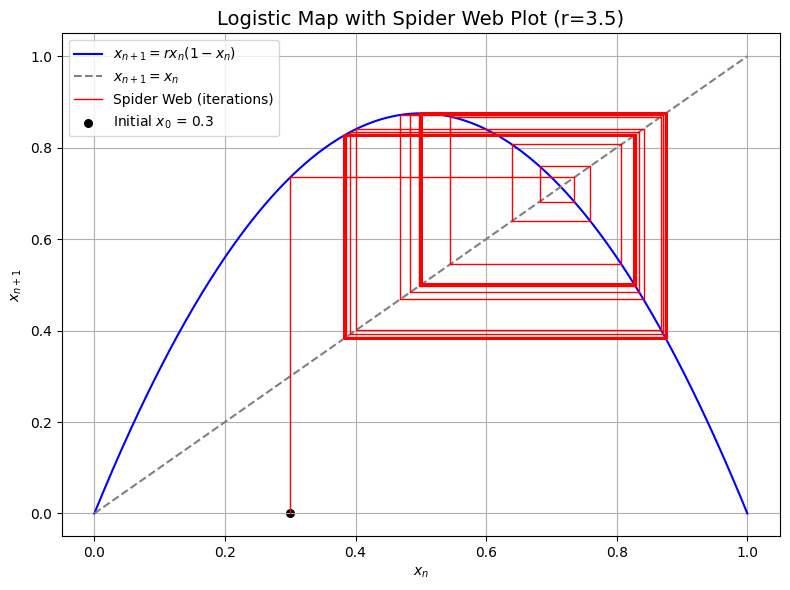

In [18]:
import numpy as np
import matplotlib.pyplot as plt


def logistic_function(x, r):
    return r * x * (1 - x)


def plot_logistic_cobweb(r, x0=0.3, steps=50):

    x = np.linspace(0, 1, 500)
    y = logistic_function(x, r)


    xn = x0
    trajectory_x = [xn]
    trajectory_y = [0]

    for _ in range(steps):
        xn1 = logistic_function(xn, r)

        trajectory_x.append(xn)
        trajectory_y.append(xn1)

        trajectory_x.append(xn1)
        trajectory_y.append(xn1)
        xn = xn1


    plt.figure(figsize=(8, 6))
    plt.plot(x, y, label=fr"$x_{{n+1}} = r x_n (1 - x_n)$", color='blue')
    plt.plot(x, x, linestyle='--', color='gray', label="$x_{n+1} = x_n$")
    plt.plot(trajectory_x, trajectory_y, color='red', lw=1, label="Spider Web (iterations)")
    plt.scatter([x0], [0], color='black', s=30, label=f"Initial $x_0$ = {x0}")
    plt.title(f"Logistic Map with Spider Web Plot (r={r})", fontsize=14)
    plt.xlabel("$x_n$")
    plt.ylabel("$x_{n+1}$")
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()


plot_logistic_cobweb(r=3.5, x0=0.3, steps=50)


# Behavior dependent on r

The image below shows the amplitude and frequency content of a logistic map that iterates itself for parameter values ranging from 2 to 4.

<ipython-input-16-8ce97a844b92>:8: RuntimeWarning: overflow encountered in scalar multiply
  return r * x * (1 - x)
/usr/local/lib/python3.11/dist-packages/numpy/fft/_pocketfft.py:94: RuntimeWarning: invalid value encountered in fft
  return ufunc(a, fct, axes=[(axis,), (), (axis,)], out=out)


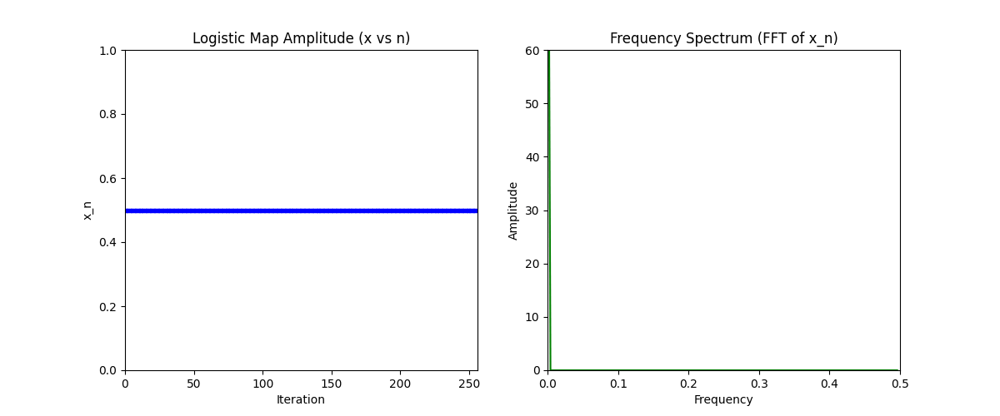

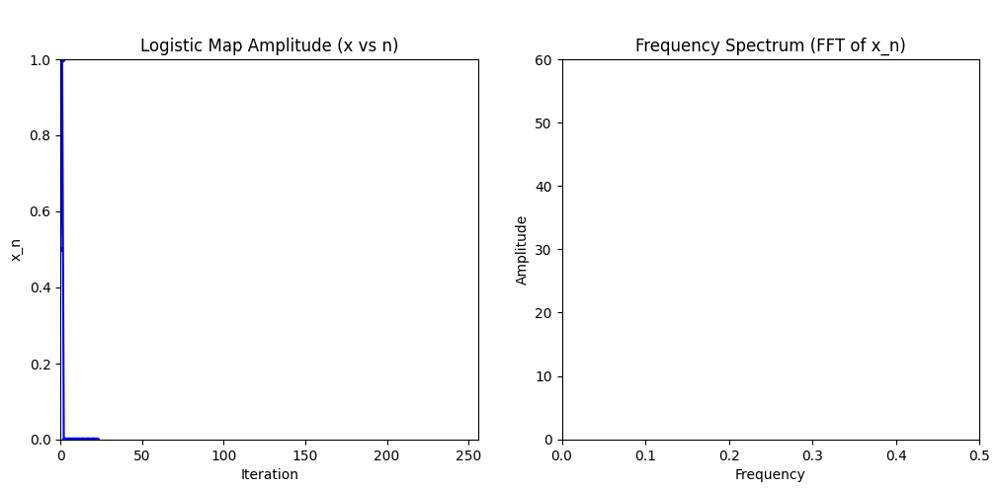

In [16]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import Image

# Logistic map function
def logistic_map(r, x):
    return r * x * (1 - x)

# 参数范围和初始设置
r_values = np.arange(2.0, 4.02, 0.02)
x0 = 0.5
steps = 256  # 为了方便做 FFT，最好为 2 的幂
freqs = np.fft.fftfreq(steps)

# 设置图形窗口（2 子图）
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
line1, = ax1.plot([], [], '-o', markersize=3, color='blue')
line2, = ax2.plot([], [], color='green')
title = fig.suptitle("", fontsize=14)

# 配置坐标轴
ax1.set_xlim(0, steps)
ax1.set_ylim(0, 1)
ax1.set_title("Logistic Map Amplitude (x vs n)")
ax1.set_xlabel("Iteration")
ax1.set_ylabel("x_n")

ax2.set_xlim(0, 0.5)  # 频率只显示正频部分
ax2.set_ylim(0, 60)
ax2.set_title("Frequency Spectrum (FFT of x_n)")
ax2.set_xlabel("Frequency")
ax2.set_ylabel("Amplitude")

# 初始化图像
def init():
    line1.set_data([], [])
    line2.set_data([], [])
    title.set_text("")
    return line1, line2, title

# 更新每一帧
def update(frame):
    r = r_values[frame]
    x = np.zeros(steps)
    x[0] = x0
    for i in range(1, steps):
        x[i] = logistic_map(r, x[i - 1])

    # FFT 分析
    fft_vals = np.abs(np.fft.fft(x))
    pos_freqs = freqs[:steps//2]
    pos_fft_vals = fft_vals[:steps//2]

    # 更新图像
    line1.set_data(np.arange(steps), x)
    line2.set_data(pos_freqs, pos_fft_vals)
    title.set_text(f"r = {r:.2f}")
    return line1, line2, title

# 创建动画
ani = animation.FuncAnimation(
    fig, update, frames=len(r_values),
    init_func=init, interval=100, blit=True, repeat=False
)

# 保存动画为 GIF 并显示（Colab 推荐用 GIF）
ani.save("logistic_amplitude_fft.gif", writer='pillow', fps=10)
Image(filename="logistic_amplitude_fft.gif")


## Case when 0 ≤ r < 1

When the parameter $r$ is in the range $0 < r < 1$, $x_n$ decreases monotonically for any value of $x_0$ between 0 and 1.  That is, $x_n$ converges to 0 in the limit $n \to \infty$

The point to which $x_n$ converges is the fixed point $x^*$
Fixed points of this type, where orbits around them converge, are called **asymptotically stable**, **stable**, or **attractive**.

Conversely, if orbits around $x$ move away from $x$ as time $n$ increases, the fixed point $x^*$ is called **unstable** or **repulsive**


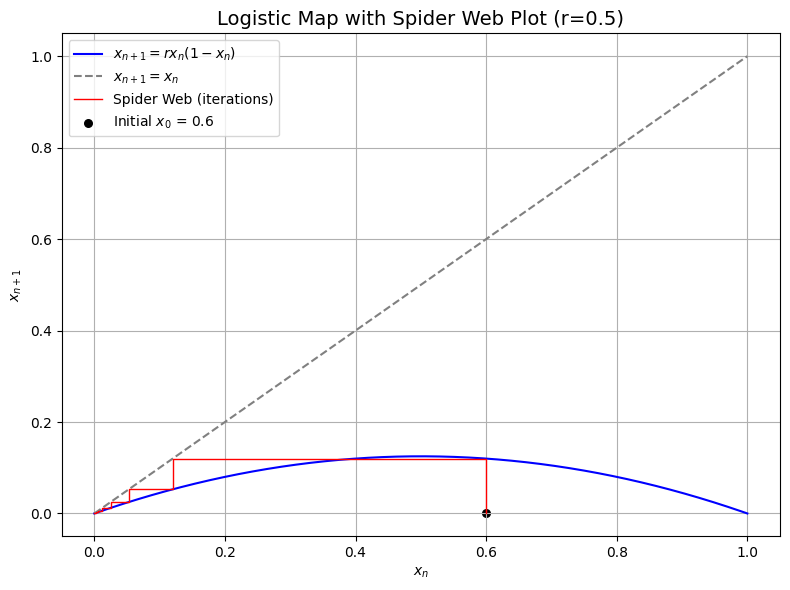

In [19]:
import numpy as np
import matplotlib.pyplot as plt


def logistic_function(x, r):
    return r * x * (1 - x)


def plot_logistic_cobweb(r, x0=0.3, steps=50):

    x = np.linspace(0, 1, 500)
    y = logistic_function(x, r)


    xn = x0
    trajectory_x = [xn]
    trajectory_y = [0]

    for _ in range(steps):
        xn1 = logistic_function(xn, r)

        trajectory_x.append(xn)
        trajectory_y.append(xn1)

        trajectory_x.append(xn1)
        trajectory_y.append(xn1)
        xn = xn1


    plt.figure(figsize=(8, 6))
    plt.plot(x, y, label=fr"$x_{{n+1}} = r x_n (1 - x_n)$", color='blue')
    plt.plot(x, x, linestyle='--', color='gray', label="$x_{n+1} = x_n$")
    plt.plot(trajectory_x, trajectory_y, color='red', lw=1, label="Spider Web (iterations)")
    plt.scatter([x0], [0], color='black', s=30, label=f"Initial $x_0$ = {x0}")
    plt.title(f"Logistic Map with Spider Web Plot (r={r})", fontsize=14)
    plt.xlabel("$x_n$")
    plt.ylabel("$x_{n+1}$")
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()


plot_logistic_cobweb(r=0.5, x0=0.6, steps=50)


A common and simple way to know whether a fixed point is **asymptotically stable** is to take the derivative of the map $f$ .
This derivative is expressed as $f'(x)$.

A fixed point $x^*$ is asymptotically stable if the following condition is satisfied:

$$
|f'(x^*)| < 1
$$

However, the discrimination method using equation does not determine the range of orbits from $x_f$ that are attracted to $x_f$.
It only guarantees that $x$ within a certain neighborhood of $x_f$ will converge.



## Case when 1 ≤ r ≤ 2

In the general case with $r$ between 1 and 2, the population will quickly approach the value $\frac{r - 1}{r}$,
independent of the initial population.


When $r = 1$ is graphed, the curve is tangent to the 45° diagonal at $x = 0$.  
In this case, the fixed point $x = 1 - \frac{1}{r}$, which exists in the negative range for $0 < r < 1$, is $x = 0$.

For $x = 0$, that is, as $r$ increases, the value of $x$ approaches 0, and just at $r = 1$, $x$ collides with $x = 0$.  
This collision gives rise to a phenomenon known as a **transcritical bifurcation**.

**Bifurcation** is a term used to describe a qualitative change in the behavior of a dynamical system.  
In this case, **transcritical bifurcation** refers to the stability of fixed points switching between each other. That is:

- When $r < 1$, $x = 0$ is stable and $x = \frac{r - 1}{r}$ is unstable.
- When $r > 1$, $x = 0$ is unstable and $x = \frac{r - 1}{r}$ is stable.

The parameter values at which bifurcations occur are called **bifurcation points**.  
In this case, $r = 1$ is the bifurcation point.


## Case when 2 ≤ r ≤ 3

When the parameter $2 < r < 3$, except for the initial values 0 and 1, the fixed point  
$x_{f2} = 1 - \frac{1}{r}$ is the same as when $1 < r \leq 2$.

However, in this case, the convergence is **not monotonic**.  
As the variable approaches $x_{f2}$, it becomes **larger and smaller than** $x_{f2}$ repeatedly,  
and follows a **convergent trajectory that oscillates around** $x_{f2}$.


## Case when 3 ≤ r ≤ 3.44949

For $r = 3$, a type of bifurcation known as a **period-doubling bifurcation** occurs.  
For $r > 3$, the orbit no longer converges to a single point, but instead alternates between large and small values even after a sufficient amount of time has passed.


These two values depend on $r$ and are given by:

$$
x = \frac{1}{2} \left( (r + 1) \pm \sqrt{(r + 1)^2 - 4(r + 1)} \right)
$$



An orbit that cycles through the same values periodically is called a **periodic orbit**.
In this case, the final behavior of the variable as $n \to \infty$ is a periodic orbit with **two periods**.  
Each value (point) that makes up a periodic orbit is called a **periodic point**.


If a certain $x$ is a periodic point, then in the case of two periodic points, applying the map twice to $x$ will return it to its original state. That is:

$$
f(f(x)) = f^{(2)}(x) = x
$$


$$
r^2 x (1 - x) \left[ 1 - r x (1 - x) \right] = x
$$

This gives us a fourth-order equation. The solutions of this equation are the **periodic points**.  


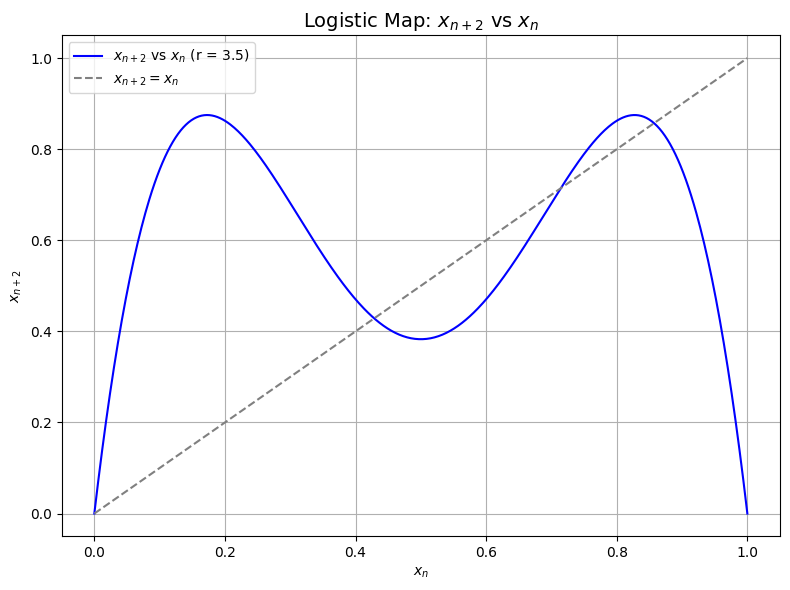

In [20]:
import numpy as np
import matplotlib.pyplot as plt

def logistic_map(x, r):
    return r * x * (1 - x)


r = 3.5
x_vals = np.linspace(0, 1, 500)


x_n1 = logistic_map(x_vals, r)
x_n2 = logistic_map(x_n1, r)


plt.figure(figsize=(8, 6))
plt.plot(x_vals, x_n2, label=fr"$x_{{n+2}}$ vs $x_n$ (r = {r})", color='blue')
plt.plot(x_vals, x_vals, linestyle='--', color='gray', label="$x_{n+2} = x_n$")  # 对角线
plt.title("Logistic Map: $x_{n+2}$ vs $x_n$", fontsize=14)
plt.xlabel("$x_n$")
plt.ylabel("$x_{n+2}$")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


## Case when 3.44949 ≤ r ≤ 3.56995


As $r$ increases, **period-doubling bifurcations** occur infinitely: 16, 32, 64, ..., and so on,
until an **infinite period**—i.e., an orbit that never returns to its original value.
This infinite series of period-doubling bifurcations is called a **cascade**.

While these period-doubling bifurcations occur infinitely, the intervals between the $r_k$ at which they occur decrease in a **geometric progression**.
Thus, an infinite number of period-doubling bifurcations occur before the parameter $r$ reaches a finite value.

Let the bifurcation from period 1 to period 2 (at $r = 3$) be counted as the **first period-doubling bifurcation**.  
Then, in this **cascade**, a stable $2^k$-periodic point occurs at the $k$-th bifurcation point.

Let the $k$-th bifurcation point in $r$ be denoted as $r_k$. In this case, it is known that:

$$
\lim_{k \to \infty} r_k = r_\infty = 3.56994\ldots
$$

Furthermore, the **rate of decrease** of $r_k$ reaches a constant value in the limit:

$$
\delta = \lim_{k \to \infty} \frac{r_{k} - r_{k-1}}{r_{k+1} - r_k} = 4.66920\ldots
$$
This value of δ is called the Feigenbaum constant because it was discovered by mathematical physicist Mitchell Feigenbaum.              


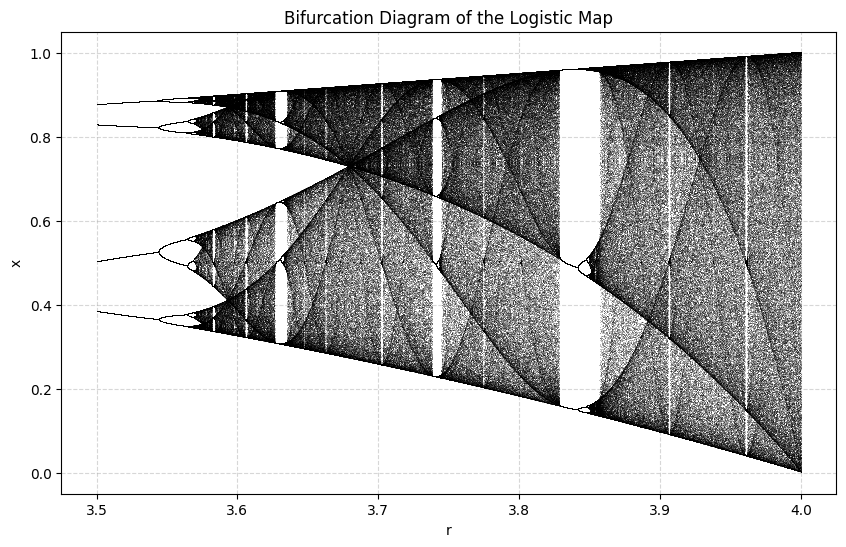

In [23]:

r_values = np.linspace(3.5, 4.0, 10000)
n_iter = 1000
last = 100
x0 = 0.5

x = np.full(r_values.shape, x0)
r_list = []
x_list = []

for _ in range(n_iter):
    x = r_values * x * (1 - x)
    if _ >= (n_iter - last):
        r_list.extend(r_values)
        x_list.extend(x)

# 绘图
plt.figure(figsize=(10, 6))
plt.plot(r_list, x_list, ',k', alpha=0.25)
plt.title("Bifurcation Diagram of the Logistic Map")
plt.xlabel("r")
plt.ylabel("x")
plt.grid(True, linestyle='--', alpha=0.5)
plt.show()


When the parameter $r = r_{\infty}$ is exactly the **accumulation point** of the period-doubling cascade,  
the variable $x_n$ is attracted to **aperiodic orbits** that never close.

In other words, there exists a periodic point with **infinite period** at $r_{\infty}$.  
This aperiodic orbit is called the **Feigenbaum attractor**—the critical $2^{\infty}$ attractor.

An **attractor** is a region that has the property of attracting surrounding orbits,  
and is the orbit that the system is eventually drawn into and continues on.  
The attractive fixed points and periodic points mentioned above are also members of the attractor family.

The structure of the Feigenbaum attractor is the same as that of a fractal figure called the **Cantor set**.  
The number of points that compose the Feigenbaum attractor is **infinite**,
and their **cardinality is equal to that of the real numbers**.

However, no matter which two of the points are chosen,  
there is always an **unstable periodic point** between them,  
and the distribution of the points is **not continuous**.

The **fractal dimension** of the Feigenbaum attractor—called the **Hausdorff dimension** or **capacity dimension**—  
is known to be approximately:

$$
\dim_{\text{Hausdorff}} \approx 0.54
$$


## Case when 3.56995 < r < 4

At $r \approx 3.56995$  is the **onset of chaos**,
marking the end of the **period-doubling cascade**.

From almost all initial conditions, we no longer observe oscillations of finite period.  
**Slight variations** in the initial population yield **dramatically different results** over time—
a prime characteristic of **chaos**.


The development of the **chaotic behavior** of the logistic sequence as the parameter $r$ varies
from approximately $3.56995$ to approximately $3.82843$ is sometimes called the **Pomeau–Manneville scenario**,
characterized by a **periodic (laminar) phase** interrupted by bursts of **aperiodic behavior**.  
Such a scenario has applications in **semiconductor devices**.





- At $r = 3.678\ldots$, $x = 0.728\ldots$,  
  two chaotic bands of the bifurcation diagram intersect at the **first Misiurewicz point** for the logistic map.  
  It satisfies the equations:

  $$
  r^3 - 2r^2 - 4r - 8 = 0,\quad x = 1 - \frac{1}{r}
  $$



- Beyond $r = 4$, almost all initial values eventually leave the interval $[0, 1]$ and **diverge**.

- The set of initial conditions which remain within $[0, 1]$ form a **Cantor set**,
  and the dynamics restricted to this Cantor set is **chaotic**.


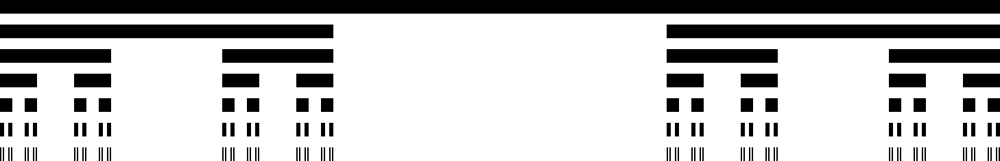

## When r = 4

When the parameter $r = 4$, the behavior becomes **chaotic** over the entire range $[0, 1]$.


The **invariant measure** of the density of points, $\rho(x)$, can also be given by the exact function for $r = 4$:

$$
\rho(x) = \frac{1}{\pi \sqrt{x(1 - x)}}
$$


## When r > 4

When the parameter $r$ exceeds 4, the vertex $r/4$ of the logistic map graph exceeds 1.  
To the extent that the graph penetrates 1, trajectories can **escape** the interval $[0, 1]$.



The bifurcation at $r = 4$ is also a type of **crisis**, specifically a **boundary crisis**.  
In this case, the attractor in $[0, 1]$ becomes **unstable and collapses**,
and since there is no attractor outside it, the trajectory **diverges to infinity**.



On the other hand, there are **orbits that remain in** $[0, 1]$ even if $r > 4$.  
Easy-to-understand examples are **fixed points** and **periodic points** in $[0, 1]$, which stay in the interval.  
However, there are also orbits **other than fixed or periodic points** that remain in $[0, 1]$.


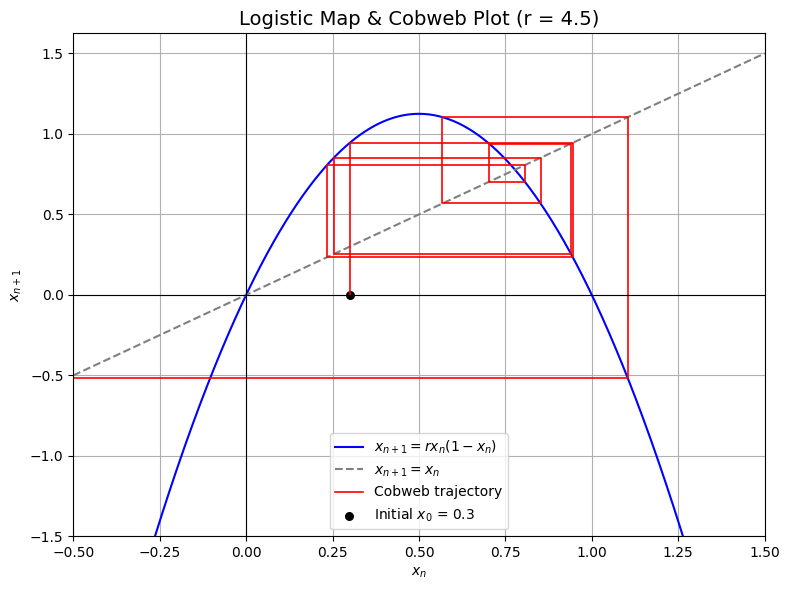

In [25]:
import numpy as np
import matplotlib.pyplot as plt

def logistic_map(x, r):
    return r * x * (1 - x)

def plot_logistic_cobweb(r, x0=0.3, steps=50):

    x_vals = np.linspace(-0.5, 1.5, 1000)
    y_vals = logistic_map(x_vals, r)

    xn = x0
    cobweb_x = [xn]
    cobweb_y = [0]

    for _ in range(steps):
        xn1 = logistic_map(xn, r)

        cobweb_x.append(xn)
        cobweb_y.append(xn1)

        cobweb_x.append(xn1)
        cobweb_y.append(xn1)
        xn = xn1

        if abs(xn) > 5:
            break

    plt.figure(figsize=(8, 6))
    plt.plot(x_vals, y_vals, label=fr"$x_{{n+1}} = r x_n(1 - x_n)$", color='blue')
    plt.plot(x_vals, x_vals, linestyle='--', color='gray', label="$x_{n+1} = x_n$")
    plt.plot(cobweb_x, cobweb_y, color='red', linewidth=1.2, label="Cobweb trajectory")
    plt.scatter([x0], [0], color='black', s=30, label=f"Initial $x_0$ = {x0}")
    plt.axhline(0, color='black', linewidth=0.8)
    plt.axvline(0, color='black', linewidth=0.8)

    plt.title(f"Logistic Map & Cobweb Plot (r = {r})", fontsize=14)
    plt.xlabel("$x_n$")
    plt.ylabel("$x_{n+1}$")
    plt.xlim(-0.5, 1.5)
    plt.ylim(-1.5, min(r/4 + 0.5, 3))
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()

plot_logistic_cobweb(r=4.5, x0=0.3, steps=50)


## When r < 0

As a decreases from 0, when −1 < r < 0, the map asymptotically approaches a stable fixed point of xf = 0, but when a exceeds −1, it bifurcates into two periodic points, and as in the case of positive values, it passes through a period doubling bifurcation and reaches chaos. Finally, when a falls below −2, the map diverges to plus infinity.

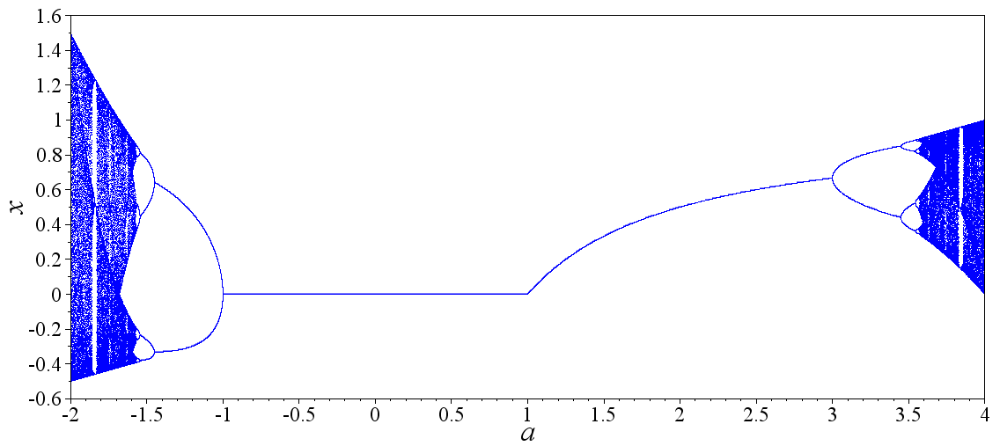

For a logistic map with a specific parameter $r$, an exact solution that explicitly includes the time $n$  
and the initial value $x_0$ has been obtained as follows:

---

### When$r=4$

$$
x_n = \frac{1}{2} \left[1 - \cos\left(2^n \cdot \arccos(1 - 2x_0)\right)\right]
$$

---

### When $r = 2$

$$
x_n = 1 - \exp\left(2^n \cdot \log(1 - x_0)\right)
$$

---

### When $r = -2$

$$
x_n = \frac{1}{2} - \frac{1}{3} \cos\left[2^n \cdot \left(\pi - 3 \arccos(-1 + 2x_0)\right)\right]
$$

---

Considering the three exact solutions above, all of them can be unified in the general form:

$$
x_n = \frac{1}{2} \left\{1 - f\left[a^n \cdot f^{-1}(1 - 2x_0)\right]\right\}
$$


# Chaos and the logistic map

The relative simplicity of the logistic map makes it a widely used point of entry
into a consideration of the concept of **chaos**.  
A rough description of chaos is that chaotic systems exhibit:  


- **Great sensitivity to initial conditions**:  
  A small or even infinitesimal variation in the initial conditions may lead to a large, finite effect.

- **Topological transitivity**:  
  The system tends to occupy all available states, in a manner similar to fluid mixing.

- **Dense periodic orbits**:  
  Periodic orbits are dense in the system's state space, meaning they occur arbitrarily close to any point.


A **small error** in the supposed initial state of the system will tend to correspond to a **large error** later in its evolution.  
Hence, **predictions about future states** become progressively (indeed, **exponentially**) worse
when there are even very small errors in our knowledge of the initial state.

This quality of **unpredictability** and **apparent randomness** led the **logistic map equation**
to be used as a **pseudo-random number generator** in early computers.



$$
\rho(x) = \frac{1}{\pi \sqrt{x(1 - x)}}
$$

# Universality

The bifurcation pattern shown above for the logistic map is not limited to the logistic map .

$$
x_{n+1} = b \sin(a x_n)
$$

if we repeatedly double the function, then scale it up by
$ \alpha $ for a certain constant
$ \alpha $:

$$
f(x) = -a f(f(-x / a))
$$

Then at the limit, we would end up with a function $g$ that satisfies:

$$
g(x) = -a \cdot g(g(-x / a))
$$

This is a **Feigenbaum function**, which appears in most **period-doubling routes to chaos**,
and is an instance of **universality**.

Further, as the period-doubling intervals become shorter and shorter,
the ratio between two period-doubling intervals converges to a limit:

$$
\delta = 4.6692016\ldots \quad \text{(the first Feigenbaum constant)}
$$


**Universality** of one-dimensional maps with parabolic maxima and **Feigenbaum constants**:

- $\delta = 4.669201\ldots$
- $\alpha = 2.502907\ldots$


# Discrete population model

$$
N_{n+1} = (a - b N_n) N_n
$$


$$
x_n = \frac{b}{a} N_n
$$


$$
x_{n+1} = a (1 - x_n) x_n
$$


$$
N_{n+1} = a \left(1 - \frac{N_n}{K} \right) N_n
$$


$$
\frac{dN}{dt} \approx \frac{N(t + \Delta t) - N(t)}{\Delta t}
$$


$$
x_n = \frac{r \Delta t \cdot N(n \Delta t)}{K(1 + r \Delta t)}
$$


# Extension to complex numbers

$$
z_{n+1} =  z_n^2 +c
$$


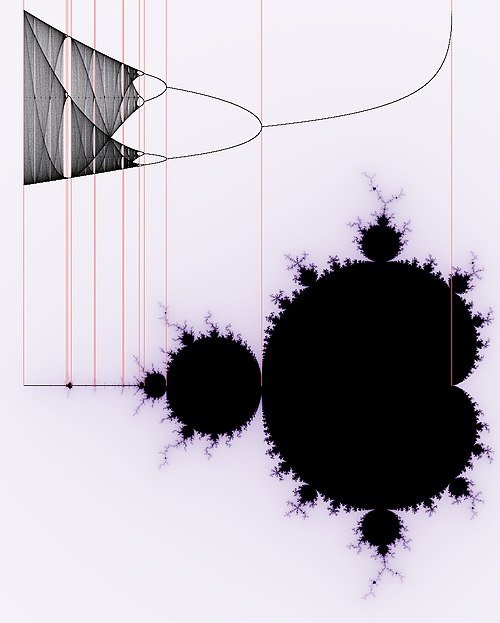

In the Mandelbrot set, each disk in the diagram corresponds to a region of asymptotically stable periodic orbits of a certain period. By juxtaposing the logistic map orbit diagram with the Mandelbrot set diagram, it is possible to see that the asymptotically stable fixed points, period doubling bifurcations, and period-three windows of the logistic map orbit diagram correspond on the real axis to the Mandelbrot set diagram.